<a href="https://colab.research.google.com/github/JorgeJaramilo060892/VC/blob/main/Week_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Go - To - Markek (G2M)
Data Glacier Intership Fall 2023
by: **Jorge Jaramillo**

##Importing Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

##Data Preparation

In [ ]:
data_cab = pd.read_csv("Cab_Data.csv")
data_city  = pd.read_csv("City.csv")
data_customer = pd.read_csv("Customer_ID.csv")
data_transaction = pd.read_csv("Transaction_ID.csv")

In [ ]:
data_cab.head(10)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.776
5,10000016,42376,Pink Cab,ATLANTA GA,6.06,72.43,63.024
6,10000017,42372,Pink Cab,AUSTIN TX,44.00,576.15,475.200
7,10000018,42376,Pink Cab,AUSTIN TX,35.65,466.10,377.890
8,10000019,42381,Pink Cab,BOSTON MA,14.40,191.61,146.880
9,10000020,42375,Pink Cab,BOSTON MA,10.89,156.98,113.256


In [ ]:
data_cab.describe()

,Transaction ID,Date of Travel,KM Travelled,Price Charged,Cost of Trip
count,3.593920e+05,359392.000000,359392.000000,359392.000000,359392.000000
mean,1.022076e+07,42964.067998,22.567254,423.443311,286.190113
std,1.268058e+05,307.467197,12.233526,274.378911,157.993661
min,1.000001e+07,42371.000000,1.900000,15.600000,19.000000
25%,1.011081e+07,42697.000000,12.000000,206.437500,151.200000
50%,1.022104e+07,42988.000000,22.440000,386.360000,282.480000
75%,1.033094e+07,43232.000000,32.960000,583.660000,413.683200
max,1.044011e+07,43465.000000,48.000000,2048.030000,691.200000


In [ ]:
data_cab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


As we can see that we have float(3) types characteristics which are:
- Km Travelled
- Price Charged
- Cost of Trip


In [ ]:
data_cab.isnull().sum()

Transaction ID    0
Date of Travel    0
Company           0
City              0
KM Travelled      0
Price Charged     0
Cost of Trip      0
dtype: int64

In [ ]:
data_cab.shape

(359392, 7)

In [ ]:
data_city.head()

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"


In [ ]:
data_customer.head()

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


In [ ]:
data_transaction.head()

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


As we embark our journey to derive meaningful insights from the **merged_data** it's paramount to fine-tune our data structure for a more comprehensive analysis of the variables to play.


In [ ]:
data_final = pd.merge(data_cab, data_transaction, on="Transaction ID")
data_final = pd.merge(data_final, data_customer, on="Customer ID")
data_final = pd.merge(data_final, data_city, on="City")
data_final

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Population,Users
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,29290,Card,Male,28,10813,"814,885","24,701"
1,10351127,43302,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228,29290,Cash,Male,28,10813,"814,885","24,701"
2,10412921,43427,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020,29290,Card,Male,28,10813,"814,885","24,701"
3,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,27703,Card,Male,27,9237,"814,885","24,701"
4,10320494,43211,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192,27703,Card,Male,27,9237,"814,885","24,701"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10307228,43162,Yellow Cab,WASHINGTON DC,38.40,668.93,525.3120,51406,Cash,Female,29,6829,"418,859","127,001"
359388,10319775,43203,Yellow Cab,WASHINGTON DC,3.57,67.60,44.5536,51406,Cash,Female,29,6829,"418,859","127,001"
359389,10347676,43287,Yellow Cab,WASHINGTON DC,23.46,331.97,337.8240,51406,Card,Female,29,6829,"418,859","127,001"
359390,10358624,43314,Yellow Cab,WASHINGTON DC,27.60,358.23,364.3200,51406,Cash,Female,29,6829,"418,859","127,001"


The application of **lambda** with **int** is used to ensure proper handling of numerical values, especially when working with floating-point number.

The transform_int function you've defined seems to be a transformation function to convert a numeric string that uses commas as thousand separators into an integer in Python. The replace(',', '') part removes the commas from the string, and then int() is used to convert the resulting string into an integer.

Here's a step-by-step explanation:

x.replace(',', ''): This part uses the replace() method for strings in Python. It takes the string x and replaces all commas with an empty string. For example, if x is "1,000", this part would convert it to "1000".

int(): After removing the commas, the int() function is used to convert the resulting string into an integer. Following the example above, "1000" would be converted to the integer 1000.

In [ ]:
def transform_int(x):
  return int(x.replace(',',''))
data_final["Population"] = data_final["Population"].apply(lambda x: transform_int(x))
data_final["Users"] = data_final["Users"].apply(lambda x: transform_int(x))

##Data Transformation

In [ ]:
data_final

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Population,Users
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,29290,Card,Male,28,10813,814885,24701
1,10351127,43302,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228,29290,Cash,Male,28,10813,814885,24701
2,10412921,43427,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020,29290,Card,Male,28,10813,814885,24701
3,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,27703,Card,Male,27,9237,814885,24701
4,10320494,43211,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192,27703,Card,Male,27,9237,814885,24701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10307228,43162,Yellow Cab,WASHINGTON DC,38.40,668.93,525.3120,51406,Cash,Female,29,6829,418859,127001
359388,10319775,43203,Yellow Cab,WASHINGTON DC,3.57,67.60,44.5536,51406,Cash,Female,29,6829,418859,127001
359389,10347676,43287,Yellow Cab,WASHINGTON DC,23.46,331.97,337.8240,51406,Card,Female,29,6829,418859,127001
359390,10358624,43314,Yellow Cab,WASHINGTON DC,27.60,358.23,364.3200,51406,Cash,Female,29,6829,418859,127001


In [ ]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction ID      359392 non-null  int64  
 1   Date of Travel      359392 non-null  int64  
 2   Company             359392 non-null  object 
 3   City                359392 non-null  object 
 4   KM Travelled        359392 non-null  float64
 5   Price Charged       359392 non-null  float64
 6   Cost of Trip        359392 non-null  float64
 7   Customer ID         359392 non-null  int64  
 8   Payment_Mode        359392 non-null  object 
 9   Gender              359392 non-null  object 
 10  Age                 359392 non-null  int64  
 11  Income (USD/Month)  359392 non-null  int64  
 12  Population          359392 non-null  int64  
 13  Users               359392 non-null  int64  
dtypes: float64(3), int64(7), object(4)
memory usage: 41.1+ MB


In [ ]:
data_final.shape

(359392, 14)

  Now we are going to focus in "Date of Travel"
  In our dataset, the "Date of Trave" column is represented as numerical values, making it challenging to interpret and communicate the temporal aspect to of our data effectively. To address this, we have decided to transform these numerical representations back into human - readeble for more intuitive and meangful representation.

###Why Transform?
1- Enhanced Interpretability: Converting numerical values to dates provides a cleares understanding of the time dimension. (This is crucial for storytelling, as it allows us to communicate when specific events or transactions occurred).

2- Facilitating Analysis: Human-redeable dates facilitate easier analysis and interpretation, eanbling us to patterns, trends, and insights related to time. This is particularly important when presenting our findings to skateholders who may not be familiar with numerical data representations.


### The Transformation Process
To achieve this, we employed a one-step process:

-**Date Transformation:** This allowed us to obtain the original, human-readable dates. Instead of relying on a manual formula, we utilized the `handle_date` function, which accurately converts Excel serial dates into the desired "day-month-year" format.


In [ ]:
original_max = data_final['Date of Travel'].max()
original_max

43465

In [ ]:
original_min = data_final['Date of Travel'].min()
original_min

42371

In [ ]:
from datetime import datetime
# Convert the original dates to the desired format
formatted_dates_max = datetime.fromordinal(datetime(1900, 1, 30).toordinal() + original_max - 2).strftime("%d-%m-%Y")
formatted_dates_min = datetime.fromordinal(datetime(1900, 1, 30).toordinal() + original_min - 2).strftime("%d-%m-%Y")



In [ ]:
print(f'This is the new format of "Date of Travel":', formatted_dates_max, formatted_dates_min)

This is the new format of "Date of Travel": 29-01-2019 31-01-2016


In [ ]:
def handle_date(date):
    transform = datetime.fromordinal(datetime(1900, 1, 30).toordinal() + date - 2).strftime("%d-%m-%Y")
    return transform

data_final["Date of Travel"] = data_cab["Date of Travel"].apply(lambda x: handle_date(x))


In [ ]:
data_final

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Population,Users
0,10000011,06-02-2016,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,29290,Card,Male,28,10813,814885,24701
1,10351127,04-02-2016,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228,29290,Cash,Male,28,10813,814885,24701
2,10412921,31-01-2016,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020,29290,Card,Male,28,10813,814885,24701
3,10000012,05-02-2016,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,27703,Card,Male,27,9237,814885,24701
4,10320494,01-02-2016,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192,27703,Card,Male,27,9237,814885,24701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10307228,06-02-2018,Yellow Cab,WASHINGTON DC,38.40,668.93,525.3120,51406,Cash,Female,29,6829,418859,127001
359388,10319775,02-02-2018,Yellow Cab,WASHINGTON DC,3.57,67.60,44.5536,51406,Cash,Female,29,6829,418859,127001
359389,10347676,03-02-2018,Yellow Cab,WASHINGTON DC,23.46,331.97,337.8240,51406,Card,Female,29,6829,418859,127001
359390,10358624,03-02-2018,Yellow Cab,WASHINGTON DC,27.60,358.23,364.3200,51406,Cash,Female,29,6829,418859,127001


### Resulting Format

The transformed dates, now presented in the format 'DD-MM-YYYY,' not only enhance the storytelling aspect of our analysis but also ensure that our audience can readily grasp the temporal context of the data.

By undertaking this transformation, we aim to make our analysis more accessible and foster a clearer understanding of the temporal dynamics within our dataset.

## Exploratory Data Analysis (EDA)

In [ ]:
# We check the shape of the dataset
print('No of records:', data_final.shape[0], '\n No of characteristics :',data_final.shape[1])

No of records: 359392 
 No of characteristics : 14


In [ ]:
# Let's see if we have null values
print(f'Nan Values:', data_final.isna().sum())

Nan Values: Transaction ID        0
Date of Travel        0
Company               0
City                  0
KM Travelled          0
Price Charged         0
Cost of Trip          0
Customer ID           0
Payment_Mode          0
Gender                0
Age                   0
Income (USD/Month)    0
Population            0
Users                 0
dtype: int64


In [ ]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction ID      359392 non-null  int64  
 1   Date of Travel      359392 non-null  object 
 2   Company             359392 non-null  object 
 3   City                359392 non-null  object 
 4   KM Travelled        359392 non-null  float64
 5   Price Charged       359392 non-null  float64
 6   Cost of Trip        359392 non-null  float64
 7   Customer ID         359392 non-null  int64  
 8   Payment_Mode        359392 non-null  object 
 9   Gender              359392 non-null  object 
 10  Age                 359392 non-null  int64  
 11  Income (USD/Month)  359392 non-null  int64  
 12  Population          359392 non-null  int64  
 13  Users               359392 non-null  int64  
dtypes: float64(3), int64(6), object(5)
memory usage: 41.1+ MB


- (3) float64
- (6) int64
- (5) object

##Data Visialization

Let's find the correlation between the following columns ["KM Travelled", "Price Charged", "Cost of Trip", "Income (USD/Month)", "Population", "Users"]


In [ ]:
data_final[["KM Travelled", "Price Charged", "Cost of Trip", "Income (USD/Month)", "Population", "Users"]].corr()


,KM Travelled,Price Charged,Cost of Trip,Income (USD/Month),Population,Users
KM Travelled,1.000000,0.835753,0.981848,-0.000544,-0.002311,-0.000428
Price Charged,0.835753,1.000000,0.859812,0.003228,0.326589,0.281061
Cost of Trip,0.981848,0.859812,1.000000,-0.000633,0.015108,0.023628
Income (USD/Month),-0.000544,0.003228,-0.000633,1.000000,0.011868,0.010464
Population,-0.002311,0.326589,0.015108,0.011868,1.000000,0.915490
Users,-0.000428,0.281061,0.023628,0.010464,0.915490,1.000000


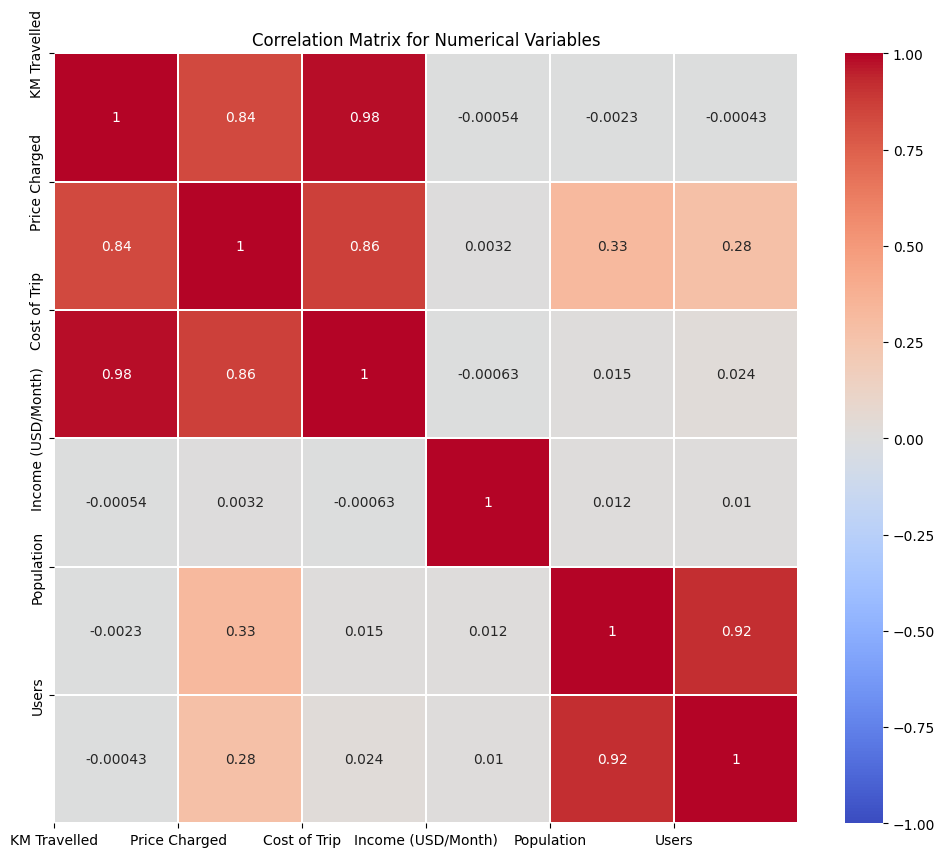

In [ ]:
# We use the correlation between numerical variables (Correlation Matrix)
# where -1 (there is a strong relationship) 0 1 (there is a strong relationship)


# Let's create a new DataFrame with the numeric columns
numeric_data = data_final[["KM Travelled", "Price Charged", "Cost of Trip", "Income (USD/Month)", "Population", "Users"]]

# Calculate the correlation matrix
corr_matrix = numeric_data.corr()

# Visualization of the correlation matrix
plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, linewidths=0.3)
plt.title('Correlation Matrix for Numerical Variables')
plt.xticks(range(6), numeric_data.columns)
plt.yticks(range(6), numeric_data.columns, rotation=90)
plt.show()


- KM Travelled and Price Charged:
There is a strong positive correlation of 0.84 between "KM Travelled" and "Price Charged". This suggests that as the distance traveled increases, so does the price charged for the trip.

- KM Travelled and Cost of Trip:
There is a strong positive correlation of 0.98 between "KM Travelled" and "Cost of Trip". This indicates that as the distance traveled increases, the cost of trip also tends to increase.

- Price Charged and Cost of Trip:
"Price Charged" and "Cost of Trip" have a positive correlation of 0.86, suggesting that there is a positive relationship between the price charged and the cost of trip.

- Income (USD/Month) and other variables:
The correlation close to zero between "Income (USD/Month)" and the other variables indicates a weak or non-existent relationship in linear terms.

- Population and Users:
There is a very strong correlation of 0.92 between "Population" and "Users". This could suggest that in more densely populated areas, there are more cab users.

Let's take a closer look at the stronger correlations

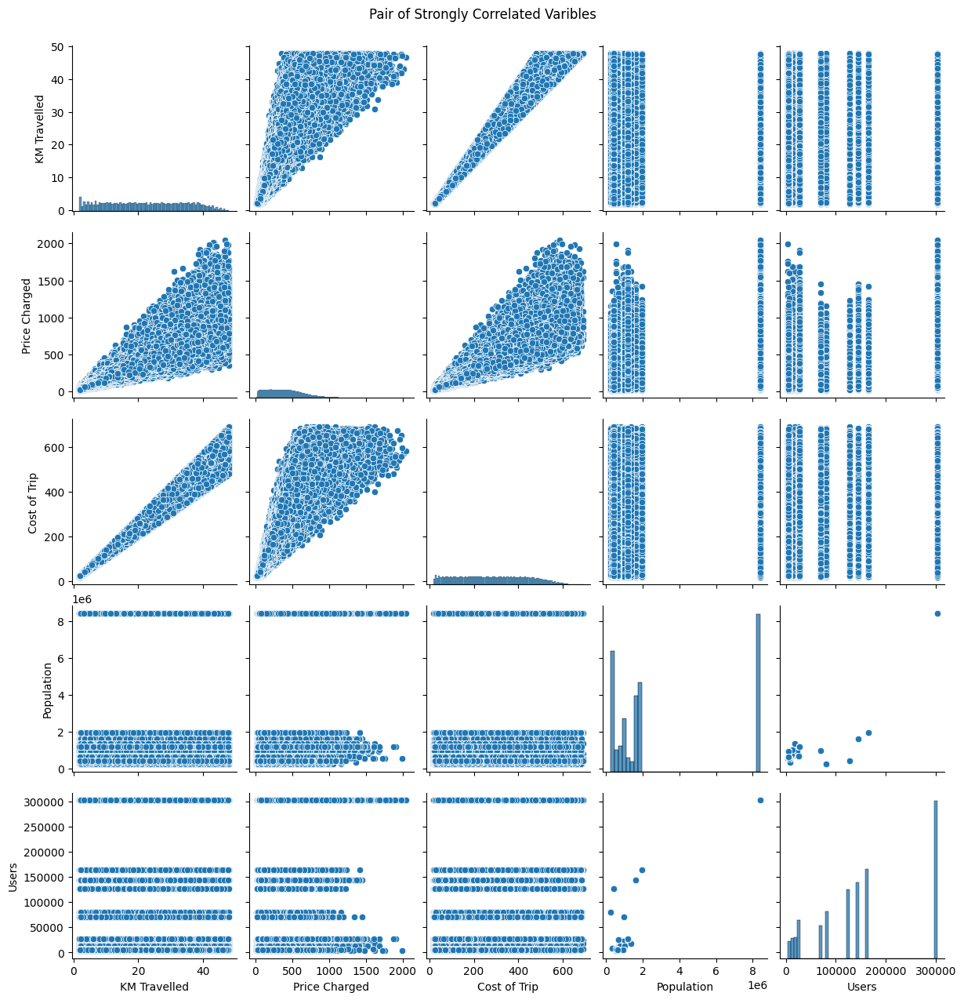

In [ ]:
strong_correlations = ["KM Travelled", "Price Charged", "Cost of Trip", "Population", "Users"]
sns.pairplot(data_final[strong_correlations])
plt.suptitle('Pair of Strongly Correlated Varibles', y= 1.02)
plt.show()

###1.- Which Company has maximum cab users at particular time period?

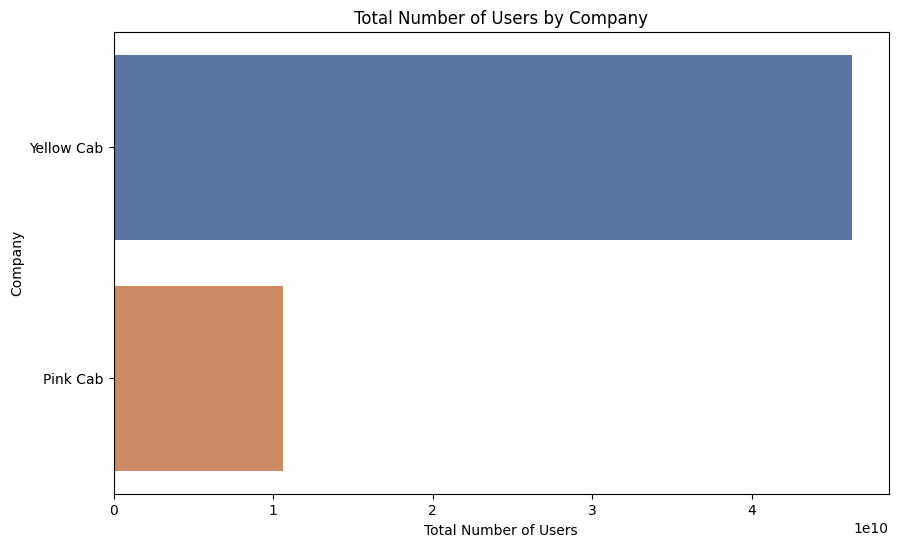

In [ ]:
# We group the data by company and sum up the users
company_users = data_final.groupby('Company')['Users'].sum().reset_index()

# Sort the companies by the number of users in descending order
company_users = company_users.sort_values(by='Users', ascending=False)

# We create the bar chart to show the number of users per company
plt.figure(figsize=(10,6))
sns.barplot(x="Users", y="Company", data=company_users, palette="deep")
plt.title("Total Number of Users by Company")
plt.xlabel("Total Number of Users")
plt.ylabel("Company")
plt.show()

In [ ]:
# Define a function to convert the string to number
def convert_to_numeric(value):
    if isinstance(value, str):
        try:
            return float(value.replace(',', ''))
        except ValueError:
            return value
    else:
        return value

# Clean the column 'Users'
data_final['Users'] = data_final['Users'].apply(convert_to_numeric)

# Calculated the mean of Users for Company
mean_users_by_company = data_final.groupby('Company')['Users'].mean().reset_index()

# Merged the information of mean with the original DataFrame
merged_data_with_mean_users = pd.merge(data_final, mean_users_by_company, on='Company', suffixes=('', '_mean'))

# Create the sunburst chart with the new information
fig = px.sunburst(
    merged_data_with_mean_users,
    color='Users_mean',  # Use the new column of mean Users
    values='Users_mean',
    path=['Company'],
    title='Distribution of Users Travel Between Companies',
    height=500
)
fig.update_traces(textinfo='label+percent entry')
fig.show()


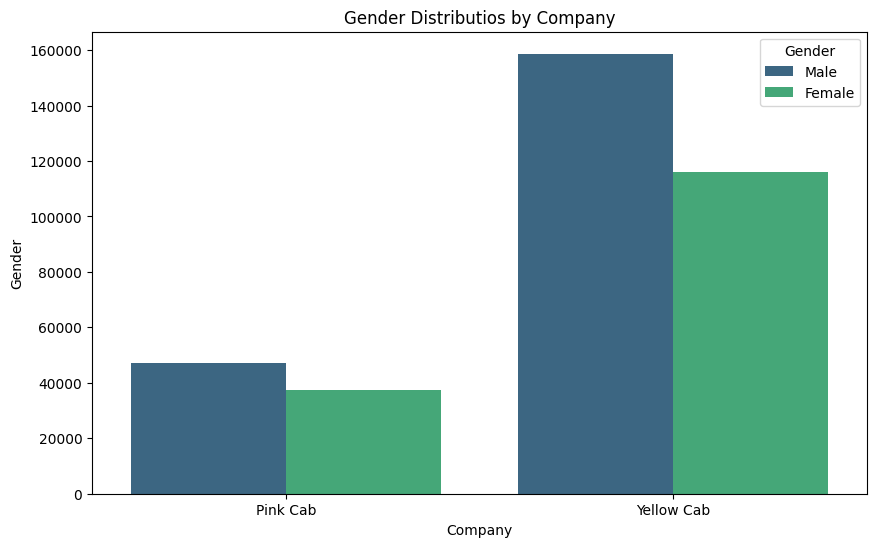

In [ ]:
# Let's now create a bar chart to see the distribution of Gender by company

plt.figure(figsize=(10,6))
sns.countplot(x="Company", hue="Gender", data=data_final, palette="viridis")
plt.title("Gender Distributios by Company")
plt.xlabel("Company")
plt.ylabel("Gender")
plt.legend(title= "Gender", loc="upper right")
plt.show()

As we can see "Users" prefer to travel in the the "Yellow Cab"  than the "Pink Cab" company.

###Now let's look at the distribution of years

In [ ]:
# Let's convert again the 'Date of Travel' column to datetime data type
data_final['Date of Travel'] = pd.to_datetime(data_final['Date of Travel'])

# We created an additional column for the year
data_final['Year'] = data_final['Date of Travel'].dt.year

# Now let's see a line chart with Plotly for the total trips and KM Travelled
fig = px.line(data_final.groupby('Year').agg({'KM Travelled': 'sum', 'Transaction ID': 'size'}).reset_index(),
              x='Year', y=['KM Travelled', 'Transaction ID'], markers=True,
              title='Trend of Total Trips and KM Travelled Over Years',
              labels={'Year': 'Year', 'value': 'Quantity', 'variable': 'Variable'},
              template='plotly_dark')
fig.update_layout(legend_title_text='Variable')
fig.show()

<ipython-input-31-8dc6e58ecdd0>:2: UserWarning:

Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.



In [ ]:
# Trips by Company
fig= px.line(data_final.groupby(["Year", "Company"]).size().reset_index(name="Total Trips"),
             x="Year", y="Total Trips", color="Company", markers=True,
             title="Trends of Total Trips  Over Years by Company",
              labels={'Year': 'Year', 'Total Trips': 'Total Trips', 'Company': 'Company'})
fig.show()

We had a slight increase in the number of KM Travelled in 2018, but a fairly norable decrease in 2019.

###Now let's take a look at the cities with the highest amount of KM traveled as well as their payment methods.

In [ ]:
pip install dash plotly pandas


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 31.5 MB/s eta 0:00:00


In [ ]:
import dash
from dash import dcc, html

In [ ]:
# Let's calculate the total "Km Travelled" and users by city and payment method
city_km_users_trend = data_final.groupby(['City', 'Payment_Mode']).agg({
    'KM Travelled': 'sum',
    'Transaction ID': 'size'
}).reset_index()

#Let's create a Dash application
app = dash.Dash(__name__)

# Layout of the panel
app.layout = html.Div(children=[
    html.H1(children='City Trends: KM Travelled and User Counts by Payment Method'),

    dcc.Graph(
        id='km-user-trend-by-city',
        figure=px.bar(city_km_users_trend, x='City', y=['KM Travelled', 'Transaction ID'],
                      color='Payment_Mode', barmode='group',
                      title='City Trends: KM Travelled and User Counts by Payment Method',
                      labels={'value': 'Quantity', 'variable': 'Metric', 'City': 'City'},
                      template='plotly_dark')
    )
])

if __name__ == "__main__":
  app.run_server(debug=True)


<IPython.core.display.Javascript object>

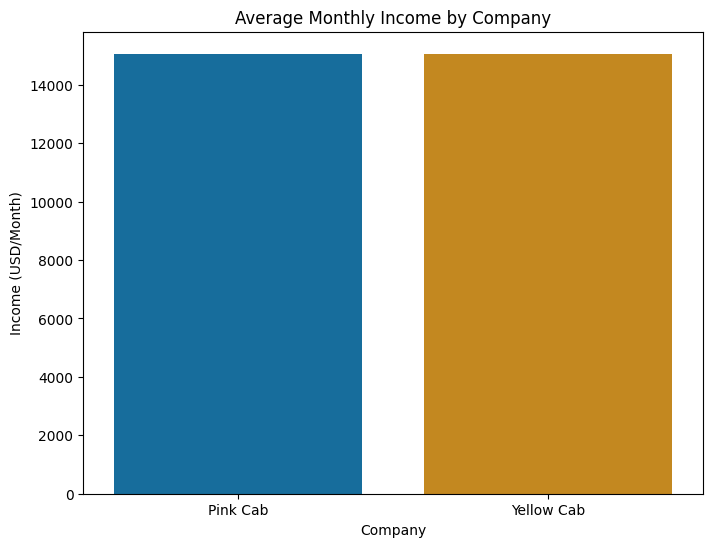

Total Incomes:       Company  Income (USD/Month)
0    Pink Cab        15059.047137
1  Yellow Cab        15045.669817


In [ ]:
# Now let's take a look to the mean income per month by company
income_means = data_final.groupby("Company")["Income (USD/Month)"].mean().reset_index()
plt.figure(figsize=(8,6))
#palettes = ["deep", "muted", "bright", "pastel", "dark", "colorblind"]
sns.barplot(x="Company", y="Income (USD/Month)", data=income_means, palette="colorblind")
plt.title("Average Monthly Income by Company")
plt.xlabel=("Company")
plt.ylabel=("Average Monthly Income (USD)")
plt.show()
print("Total Incomes:", income_means)

We are going to create an explicit "Projected Profit" column To conclude our (EDA)

In [ ]:
data_final["Projected Profit"] = data_final["Price Charged"] - data_final["Cost of Trip"]
total_profits_by_company = data_final.groupby("Company")["Projected Profit"].sum().reset_index()
mean_profits_by_company = data_final.groupby("Company")["Projected Profit"].mean().reset_index()

In [ ]:
# Total Profits Distribution by Company (histplot)
fig_hist = px.histogram(data_final, x='Projected Profit', color='Company', nbins=30, marginal='box', histnorm='probability density',
                        labels={'Projected Profit': 'Profits', 'Company': 'Company'},
                        title='Total Profits Distribution by Company')
fig_hist.show()
print(total_profits_by_company)

      Company  Projected Profit
0    Pink Cab      5.307328e+06
1  Yellow Cab      4.402037e+07


In [ ]:
fig_bar = px.bar(mean_profits_by_company, x='Company', y='Projected Profit', color='Company',
                 labels={'Projected Profit': 'Mean Profits', 'Company': 'Company'},
                 title='Mean Profits by Company')
fig_bar.show()
print(mean_profits_by_company)

      Company  Projected Profit
0    Pink Cab         62.652174
1  Yellow Cab        160.259986


# Conclusion
### After conducting Exploratory Data Analysis (EDA), we have clearly identified significant differences between the two taxi companies. It is evident that the company with higher profits is Yellow Cab as compared to Pink Cab, based on the distribution of various factors visualized in the statistics. Considering these findings, it would be advisable to explore investment opportunities in Yellow Cab.